In [1]:
using Distributions
using AlphaStableDistributions
using Statistics
using Plots
using StatsPlots
using StatsFuns

In [2]:
include("datasets.jl")
include("diffusion.jl")
include("experiment.jl")
include("priors.jl")

generate_levy_priors

Parameters

•	a = threshold separation; 

•	zr = relative starting point;

•	v0 = drift rate for blue stimuli or non-word stimuli;

•	v1 = drift rate for orange stimuli or word stimuli; 

•	t0 = non-decisional time; 

•	alpha = stability parameter of noise distribution; 

•	sz = across-trial variability in starting point; 

•	sv = across-trial variability in drift rate;

•	st = across-trial variability in non-decisional processes 



Other Stuff

•	dt = granularity of time steps

•	tol = maximum number of time steps

•	rho = scaling factor

•	beta = skewness of the levy distribution (always 0 in our use case?)

## Prior predictive & pushforward checks

### Prior predictive checks: RTs & Accuracies

In [3]:
# Simulate data
batch_size = 100
n_clusters = 40
n_trials = 900

m1_batch_indices, m1_batch_data = generate_levy_batch(1, batch_size, n_clusters, n_trials);
m2_batch_indices, m2_batch_data = generate_levy_batch(2, batch_size, n_clusters, n_trials);
m3_batch_indices, m3_batch_data = generate_levy_batch(3, batch_size, n_clusters, n_trials);
m4_batch_indices, m4_batch_data = generate_levy_batch(4, batch_size, n_clusters, n_trials);

model_batches = [m1_batch_data, m2_batch_data, m3_batch_data, m4_batch_data];

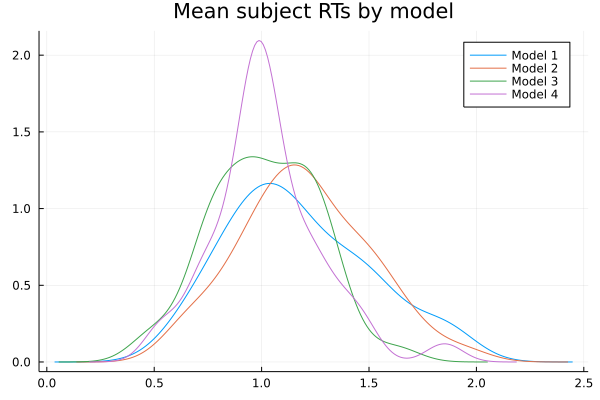

In [4]:
# Plot mean subject reaction times by model

subject_rt_means = plot(title="Mean subject RTs by model")
    for (i,m) in enumerate(model_batches)
        label=["Model 1" "Model 2" "Model 3" "Model 4"][1,i]
        density!(mean(m[:, :, :, 2], dims=(1,3))[1,:,1], labels=label)
    end
display(subject_rt_means)

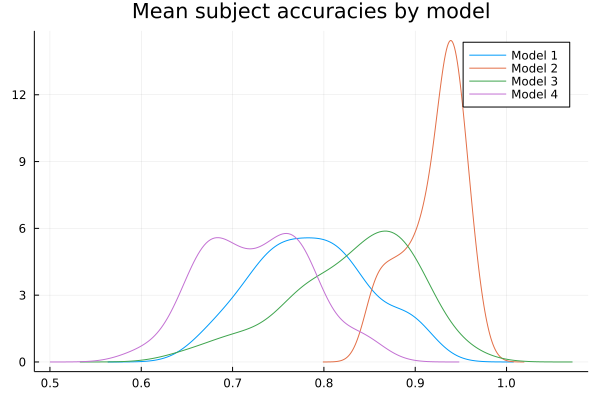

In [5]:
# Plot subject accuracies by model

subject_accs = plot(title="Mean subject accuracies by model")
    for (i, m) in enumerate(model_batches)
        label=["Model 1" "Model 2" "Model 3" "Model 4"][1,i]
        subject_accuracy = fill(0.0, n_clusters)
        for k in 1:n_clusters
            subject_accuracy[k] = sum(m[:, k, :, 1] .== m[:, k, :, 3])/length(m[:, k, :, 1])
        end
        density!(subject_accuracy, labels=label)
    end
display(subject_accs)

In [6]:
# RTs for correct vs incorrect trials

correct_trials = Any[]
incorrect_trials = Any[]

for (i, m) in enumerate(model_batches)
    append!(correct_trials, m[:,:,:,2][m[:, :, :, 1] .== m[:, :, :, 3]])
    append!(incorrect_trials, m[:,:,:,2][m[:, :, :, 1] .!= m[:, :, :, 3]])
end

println("Correct trials       incorrect trials")
println([mean(correct_trials), mean(incorrect_trials)])
println([std(correct_trials), std(incorrect_trials)])

Correct trials       incorrect trials
[1.0954991169066586, 1.135535513268423]
[0.6258866565853028, 0.7106188310786644]


### Pushforward checks: Hyperpriors

In [7]:
# Plot prior pushforwards
n_sims = 100000
number_params = 12

sim_data = fill(0.0, (n_sims, number_params))

for i in 1:n_sims
    sim_data[i, :] = generate_levy_hyperpriors()
end

sim_data_means = round.(mean(sim_data, dims=1), digits=2)
sim_data_sds = round.(std(sim_data, dims=1), digits=2)

1×12 Matrix{Float64}:
 1.0  0.15  0.25  0.03  1.0  0.24  1.0  0.23  1.0  0.05  1.0  0.88

[5.0 0.4 0.0 0.04 5.0 0.51 5.0 0.51 5.0 0.1 1.5 1.64]
[1.0 0.15 0.25 0.03 1.0 0.24 1.0 0.23 1.0 0.05 1.0 0.88]


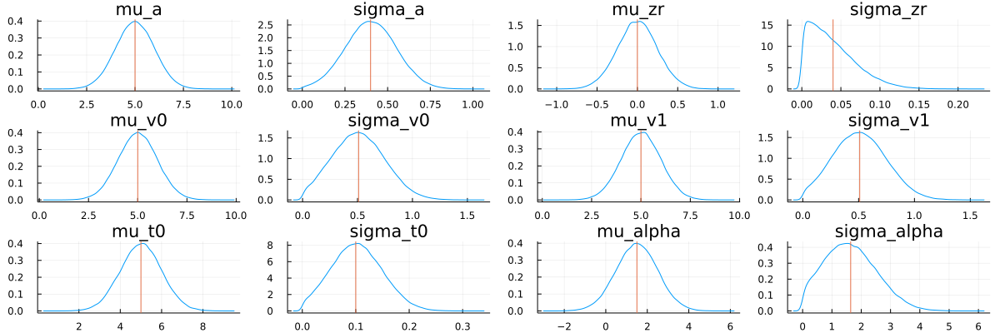

In [8]:
params = ["mu_a" "sigma_a" "mu_zr" "sigma_zr" "mu_v0" "sigma_v0" "mu_v1" "sigma_v1" "mu_t0" "sigma_t0" "mu_alpha" "sigma_alpha"]
println(sim_data_means)
println(sim_data_sds)
density(sim_data, layout=number_params, size=(1200,400), title=params, legend=false)
vline!(sim_data_means, layout=number_params, label="")

### Pushforward checks: (Lower level) Priors

#### Multiple datasets

In [9]:
# Simulate and summarize multiple datasets
n_sims_datasets = 10000
n_sims_persons = 100
number_params = 9

sim_data = fill(0.0, (n_sims_datasets, n_sims_persons, number_params))

for d in 1:n_sims_datasets
    hyperpriors = generate_levy_hyperpriors()
    for i in 1:n_sims_persons
        sim_data[d, i, :] = generate_levy_priors(hyperpriors...)
    end
end

sim_data_means_per_dataset = round.(mean(sim_data, dims=2), digits=2)[:,1,:]
sim_data_means = round.(mean(sim_data, dims=1:2), digits=2)[1,:,:]
sim_data_sds = round.(std(sim_data, dims=1:2), digits=2)[1,:,:];

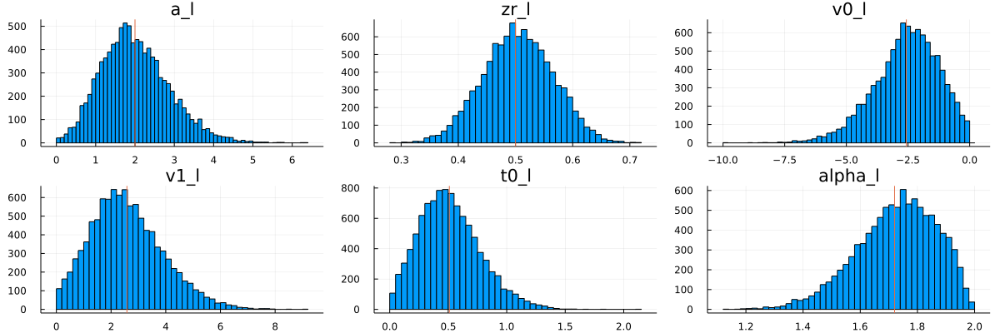

In [10]:
# Plot dataset means of hierarchical priors (mean[p(theta|eta)])
histogram(sim_data_means_per_dataset[:,1:6], layout=6, size=(1200,400), title=["a_l" "zr_l" "v0_l" "v1_l" "t0_l" "alpha_l"], legend=false)
vline!(sim_data_means[:,1:6], layout=6, label="")

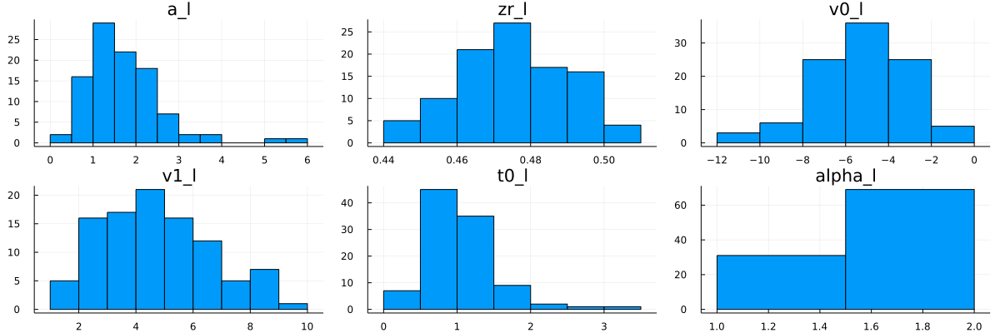

In [11]:
# Plot a single dataset (p(theta|eta))
histogram(sim_data[8,:,1:6], layout=6, size=(1200,400), title=["a_l" "zr_l" "v0_l" "v1_l" "t0_l" "alpha_l"], legend=false)

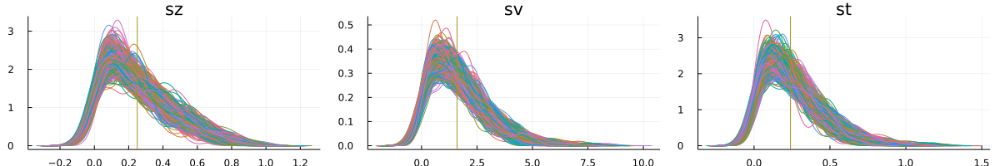

In [12]:
# Plot non hierarchical intertrial variabilities by overlaying the distributions per dataset (p(theta|eta))
# Only for first 500 datasets to keep computation times reasonable
dens_plot = density(sim_data[1,:,7:end], layout=(1,3), size=(1200,200),title=["sz" "sv" "st"], legend=false)
for d in 2:500
    density!(sim_data[d,:,7:end], layout=(1,3), size=(1200,200))
end
vline!(sim_data_means[:,7:end], layout=(1,3), label="")
display(dens_plot)

In [13]:
# Full overlaying plots of the distributions per dataset (p(theta|eta))
# Ressource intensive but can deliver additional insights

#dens_plot = density(sim_data[1,:,:], layout=number_params, size=(1200,400),title=["a_l" "zr_l" "v0_l" "v1_l" "t0_l" "alpha_l" "sz" "sv" "st"], legend=false)
#for d in 2:n_sims_datasets
#    density!(sim_data[d,:,:], layout=number_params, size=(1200,400))
#end
#vline!(sim_data_means[1,:,:], layout=number_params, label="")
#println("a_l zr_l v0_l v1_l t0_l alpha_l sz sv st")
#println(sim_data_means[1,:,:])
#println(sim_data_sds[1,:,:])
#display(dens_plot)

In [14]:
# Full overlaying plots of the distributions per dataset (p(theta|eta))
# Ressource intensive but can deliver additional insights

#dens_plot = histogram(sim_data[1,:,:], layout=number_params, size=(1200,400),title=["a_l" "zr_l" "v0_l" "v1_l" "t0_l" "alpha_l" "sz" "sv" "st"], legend=false, alpha=0.2)
#for d in 2:n_sims_datasets
#    histogram!(sim_data[d,:,:], layout=number_params, size=(1200,400), alpha=0.2)
#end
#vline!(sim_data_means[1,:,:], layout=number_params, label="")
#display(dens_plot)